# <center>单个被试分析过程</center>

In [1]:
%matplotlib inline
import sys
sys.path.append('/home/hcp/anaconda3/envs/xj/lib/python3.8/site-packages')
import os
import numpy as np
import pandas as pd
import nibabel as nib
from glob import glob
from bids import BIDSLayout
import matplotlib.pyplot as plt
from nilearn.image import mean_img, load_img
from nilearn.glm import threshold_stats_img
from nilearn.glm.first_level import FirstLevelModel
from nilearn.glm.second_level import SecondLevelModel
from nilearn.reporting import make_glm_report, get_clusters_table
from nilearn.plotting import plot_stat_map, plot_anat, plot_img, show, plot_glass_brain, plot_design_matrix, plot_contrast_matrix

/home/hcp/anaconda3/envs/base_zss/lib/python3.8/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '


In [7]:
data_dir = '/mnt/sdb1/Judge-fMRI-Data/Bids_with_AFNI_Despike'
layout = BIDSLayout(data_dir, derivatives=True)
tr = layout.get_tr(derivatives=True)

outdir = 'results_0620'
if not os.path.exists(outdir):
    os.mkdir(outdir)

conditions = ['common', 'legal', 'moral']

### 定义一阶模型
其中drift_model参数的设置，会被最终添加到设计矩阵中（<font color="red">详情后述</font>）

In [8]:
fmri_glm = FirstLevelModel(t_r=tr,
                           noise_model='ar1',
                           hrf_model='spm',
                           drift_model='cosine',
                           high_pass=1./160,
                           signal_scaling=False,
                           minimize_memory=False)

### 功能像文件

In [9]:
fmri_file = layout.get(subject='002', task='judgment', scope='derivatives', suffix='bold', extension='nii.gz', return_type='file')[0]
fmri_file

'/mnt/sdb1/Judge-fMRI-Data/Bids_with_AFNI_Despike/derivatives/fmriprep/sub-002/func/sub-002_task-judgment_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz'

In [12]:
def build_Subs():
    path = '/mnt/sdb1/Judge-fMRI/Data/AnalysisData/Information_of_trials.txt'
    with open(path, 'r', encoding='utf-8') as f:
        f_data = f.read().split('\n')
        data = f_data[3:]
        judge_subs = f_data[1].split(',')
        layperson_subs = f_data[2].split(',')

    build_subs_dict = {}
    for i in data:
        li = i.split(',')
        build_subs_dict[li[0]] = []
        for j in range(int((len(li)-1)/2)):
            build_subs_dict[li[0]].append([li[2*j+1], li[(j+1)*2]])

    return judge_subs, layperson_subs, build_subs_dict

judge_subs, layperson_subs, build_subs_dict = build_Subs()

In [7]:
# for i in judge_subs + layperson_subs:
#     event_file = layout.get(subject=i, suffix='events')[0].path
#     events = pd.read_table(event_file)
#     print(event_file, len(events))

/media/hcp/sdb12/fMRI_Project/demobids/sub-001/func/sub-001_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-002/func/sub-002_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-003/func/sub-003_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-005/func/sub-005_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-006/func/sub-006_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-007/func/sub-007_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-008/func/sub-008_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-009/func/sub-009_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-010/func/sub-010_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-014/func/sub-014_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/demobids/sub-015/func/sub-015_task-judgment_events.tsv 28
/media/hcp/sdb12/fMRI_Project/de

In [13]:
build_subs_dict

{'002': [['1', '61'], ['192', '220']],
 '007': [['88', '142']],
 '008': [['210', '224']],
 '009': [['1', '11']],
 '019': [['1', '118']],
 '022': [['1', '18'], ['174', '184']],
 '023': [['1', '4'], ['185', '200']],
 '031': [['1', '16'], ['162', '188']],
 '033': [['133', '146']],
 '034': [['1', '6'], ['42', '47']],
 '038': [['1', '37'], ['112', '115']],
 '042': [['56', '76'], ['118', '141']],
 '044': [['1', '9']],
 '046': [['34', '42']],
 '047': [['1', '8'], ['43', '84']],
 '050': [['32', '50'], ['110', '123']],
 '051': [['1', '16'], ['125', '130']]}

### events.tsv文件

In [14]:
event_file = layout.get(subject='002', suffix='events')[0].path
events = pd.read_table(event_file)
events

,onset,duration,trial_type
0,3.000,17.584,moral
1,23.620,16.356,common
2,43.021,24.195,legal
3,70.247,5.297,moral
4,78.572,14.604,common
5,96.205,28.555,legal
6,127.785,6.990,moral
7,137.811,11.092,common
8,151.925,13.834,legal
9,210.380,13.219,common


In [15]:
da1 = events[1*3<=events['onset']][events['onset']<=61*3]
da1

,onset,duration,trial_type
0,3.000,17.584,moral
1,23.620,16.356,common
2,43.021,24.195,legal
3,70.247,5.297,moral
4,78.572,14.604,common
5,96.205,28.555,legal
6,127.785,6.990,moral
7,137.811,11.092,common
8,151.925,13.834,legal


In [16]:
da2 = events[192*3<=events['onset']][events['onset']<=220*3]
da2

<ipython-input-16-859e6d34e4ee>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  da2 = events[192*3<=events['onset']][events['onset']<=220*3]


,onset,duration,trial_type
27,593.994,24.754,legal


In [17]:
event_file = layout.get(subject='002', suffix='events')[0].path
events = pd.read_table(event_file)
sub = '002'
da_index = []
if sub in list(build_subs_dict.keys()):
    for j in build_subs_dict[sub]:
        da = events[int(j[0])*3<=events['onset']][events['onset']<=int(j[1])*3]
        da_index += da.index.to_list()
print(da_index)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 27]


<ipython-input-17-259ca647f261>:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  da = events[int(j[0])*3<=events['onset']][events['onset']<=int(j[1])*3]


In [18]:
da1_index = da1.index.to_list()
print(da1_index)
da2_index = da2.index.to_list()
print(da2_index)
da_index = da1_index + da2_index
print(da_index)

[0, 1, 2, 3, 4, 5, 6, 7, 8]
[27]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 27]


In [19]:
events = events.drop(da_index)#.loc['26', 'onset'] = 600
events

,onset,duration,trial_type
9,210.380,13.219,common
10,226.629,23.482,legal
11,253.137,5.830,moral
12,261.996,20.706,common
13,285.735,22.135,legal
14,310.892,11.090,moral
15,325.005,24.897,common
16,352.932,18.818,legal
17,374.786,7.468,moral
18,426.018,30.043,legal


### 6个头动参数作为混淆变量

In [20]:
confounds_file = layout.get(subject='002', scope='derivatives', extension='.tsv')[0].path
confounds = pd.read_table(confounds_file)
confounds_glm = confounds[['trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']].replace(np.nan, 0)
confounds_glm

,trans_x,trans_y,trans_z,rot_x,rot_y,rot_z
0,-0.017048,-0.103019,0.044931,-0.000045,0.000412,-0.001568
1,-0.017162,-0.105438,0.040557,0.000139,-0.000319,-0.001479
2,-0.025968,-0.113361,0.000127,0.000035,0.000999,-0.001032
3,-0.002629,-0.096329,0.026666,0.000018,0.000988,-0.000868
4,0.016788,-0.082532,0.005243,0.000142,0.000833,-0.001016
...,...,...,...,...,...,...
215,-0.040797,-0.044666,0.011753,0.002224,0.000134,0.002376
216,-0.035259,-0.035241,0.011793,0.002184,0.000245,0.002376
217,-0.047070,-0.044940,0.011844,0.002399,0.000393,0.002376
218,-0.051388,-0.039335,0.019830,0.002399,0.000126,0.002376


In [36]:
# index_list = list(range(0, 61)) + list(range(191, 220))
# index_list
# confounds_glm = confounds_glm.drop(index_list).reset_index()[['trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']]
# confounds_glm

### 传入3个参数：功能像文件、events文件、混淆变量

In [21]:
fmri_glm = fmri_glm.fit(fmri_file, events, confounds_glm)# events and confounds_glm need to be same

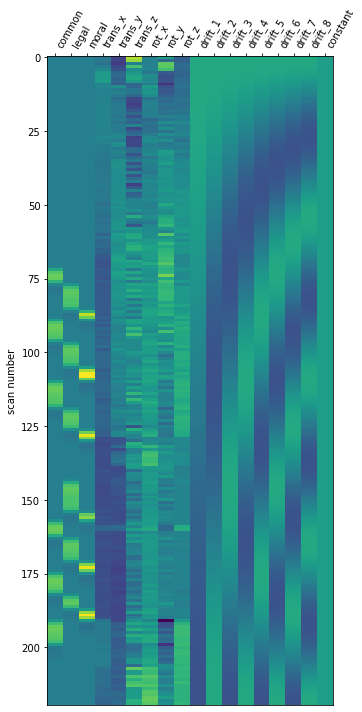

       common  legal  moral   trans_x   trans_y   trans_z     rot_x     rot_y  \
0.0       0.0    0.0    0.0 -0.017048 -0.103019  0.044931 -0.000045  0.000412   
3.0       0.0    0.0    0.0 -0.017162 -0.105438  0.040557  0.000139 -0.000319   
6.0       0.0    0.0    0.0 -0.025968 -0.113361  0.000127  0.000035  0.000999   
9.0       0.0    0.0    0.0 -0.002629 -0.096329  0.026666  0.000018  0.000988   
12.0      0.0    0.0    0.0  0.016788 -0.082532  0.005243  0.000142  0.000833   
...       ...    ...    ...       ...       ...       ...       ...       ...   
645.0     0.0    0.0    0.0 -0.040797 -0.044666  0.011753  0.002224  0.000134   
648.0     0.0    0.0    0.0 -0.035259 -0.035241  0.011793  0.002184  0.000245   
651.0     0.0    0.0    0.0 -0.047070 -0.044940  0.011844  0.002399  0.000393   
654.0     0.0    0.0    0.0 -0.051388 -0.039335  0.019830  0.002399  0.000126   
657.0     0.0    0.0    0.0 -0.051895 -0.034397  0.019271  0.002269  0.000202   

          rot_z   drift_1  

In [22]:
design_matrix = fmri_glm.design_matrices_[0]
plot_design_matrix(design_matrix)
plt.show()
print(design_matrix)

### 此处显著性水平选为0.001，其对应的z值为3.090……，因此展示时threshold选为3.0

In [23]:
from scipy.stats import norm
z_threshold = norm.isf(0.001)
z_threshold

3.090232306167813

### 保存z_map

In [36]:
# z_map.to_filename(os.path.join(outdir, 'sub-%s-%s_zmap.nii.gz' % ('002', 'legal')))

# Display the z_map of each sub

/home/hcp/anaconda3/envs/base_zss/lib/python3.8/site-packages/nilearn/plotting/img_plotting.py:348: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  anat_img = load_mni152_template()


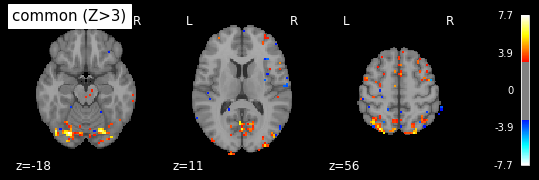

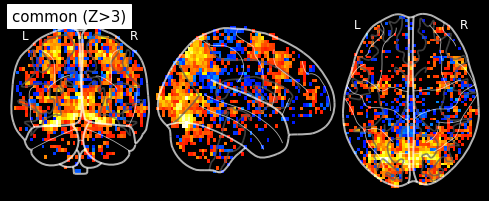

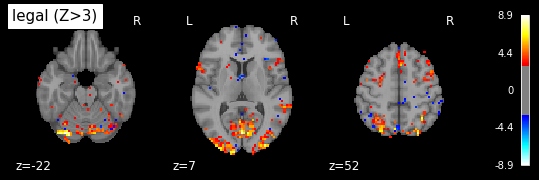

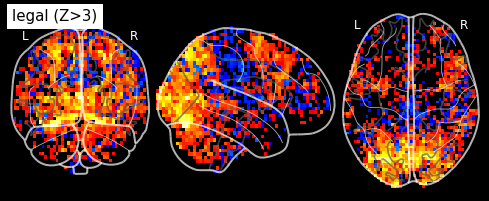

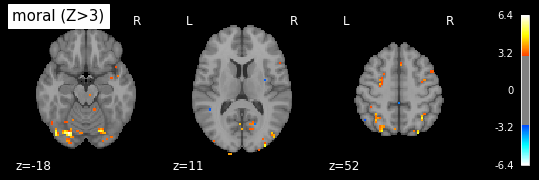

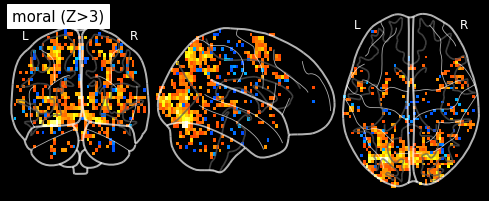

In [24]:
for con in conditions:
    z_map = fmri_glm.compute_contrast(con, output_type='z_score')
    plot_stat_map(z_map, threshold=3.0, display_mode='z', cut_coords=3, black_bg=True, title=con + ' (Z>3)')
    plot_glass_brain(z_map, threshold=3.0, black_bg=True, plot_abs=False, title=con + ' (Z>3)')
#     z_map.to_filename(os.path.join(outdir, 'sub-%s-%s_zmap.nii.gz' % ('002', 'legal')))
    plt.show()

# need to delete the trial information

In [26]:
%matplotlib inline
import sys
sys.path.append('/home/hcp/anaconda3/envs/xj/lib/python3.8/site-packages')
import os
import numpy as np
import pandas as pd
import nibabel as nib
from glob import glob
from bids import BIDSLayout
import matplotlib.pyplot as plt
from nilearn.image import mean_img, load_img
from nilearn.glm import threshold_stats_img
from nilearn.glm.first_level import FirstLevelModel
from nilearn.glm.second_level import SecondLevelModel
from nilearn.reporting import make_glm_report, get_clusters_table
from nilearn.plotting import plot_stat_map, plot_anat, plot_img, show, plot_glass_brain, plot_design_matrix, plot_contrast_matrix

In [32]:
def build_Subs():
    path = '/mnt/sdb1/Judge-fMRI/Data/AnalysisData/Information_of_trials.txt'
    with open(path, 'r', encoding='utf-8') as f:
        f_data = f.read().split('\n')
        data = f_data[3:]
        judge_subs = f_data[1].split(',')
        layperson_subs = f_data[2].split(',')

    build_subs_dict = {}
    for i in data:
        li = i.split(',')
        build_subs_dict[li[0]] = []
        for j in range(int((len(li)-1)/2)):
            build_subs_dict[li[0]].append([li[2*j+1], li[(j+1)*2]])

    return judge_subs, layperson_subs, build_subs_dict

In [33]:
data_dir = '/mnt/sdb1/Judge-fMRI-Data/Bids_with_AFNI_Despike'
layout = BIDSLayout(data_dir, derivatives=True)
tr = layout.get_tr(derivatives=True)

outdir = 'results_demo'
if not os.path.exists(outdir):
    os.mkdir(outdir)

conditions = ['common', 'legal', 'moral']

In [34]:
judge_subs, layperson_subs, build_subs_dict = build_Subs()

In [35]:
print(type(judge_subs))
print(judge_subs)

<class 'list'>
['001', '002', '003', '005', '006', '007', '008', '009', '010', '014', '015', '019', '022', '023', '024', '025']


In [36]:
subs = ['001', '002']

In [37]:
for i in subs:
    fmri_file = layout.get(subject=i, task='judgment', scope='derivatives', suffix='bold', extension='nii.gz', return_type='file')[0]
    # alter the BOLD 
    if i in list(build_subs_dict.keys()):
        img = load_img(fmri_file)
        data = img.get_fdata()
        for j in build_subs_dict[i]:
            img._fdata_cache[:, :, :, int(j[0]) - 1: int(j[1])] = 0
        data = img.get_fdata()
        new_image = nib.Nifti1Image(data, img.affine)
        fmri_file = i + '_new.nii.gz'
        nib.save(new_image, fmri_file)
    print('\n')
    print(fmri_file)
        



/mnt/sdb1/Judge-fMRI-Data/Bids_with_AFNI_Despike/derivatives/fmriprep/sub-001/func/sub-001_task-judgment_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


002_new.nii.gz


# <center>一次性处理所有被试的FirstLevel-drop trial only on the design matrix</center>

['001', '002', '003', '005', '006', '007', '008', '009', '010', '014', '015', '019', '022', '023', '024', '025', '031', '033', '034', '035', '038', '042', '044', '046', '047', '050', '051', '053']


/home/hcp/anaconda3/envs/base_zss/lib/python3.8/site-packages/nilearn/_utils/glm.py:332: RuntimeWarning: divide by zero encountered in true_divide
  return np.where(X <= 0, 0, 1. / X)


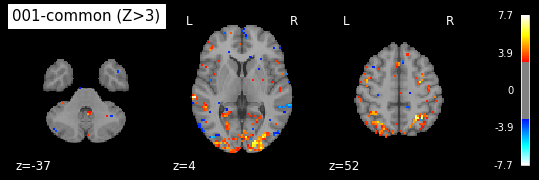

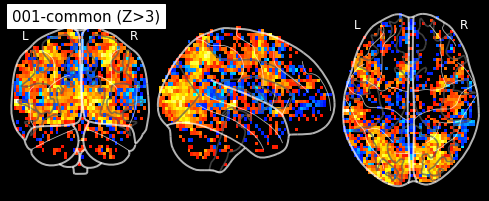

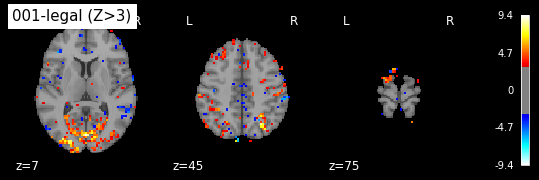

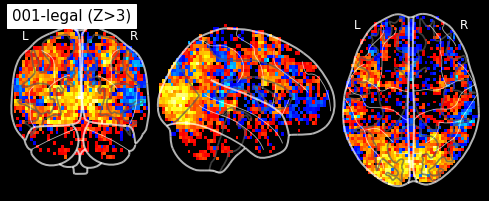

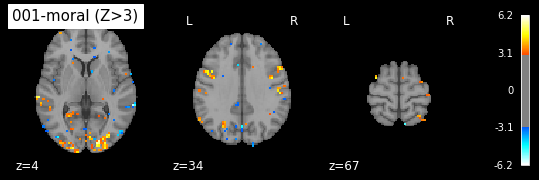

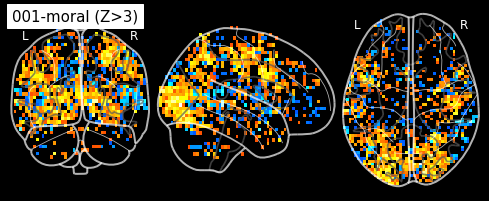

<ipython-input-39-ab013e565062>:82: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  da = events[int(j[0])*3<=events['onset']][events['onset']<=int(j[1])*3]


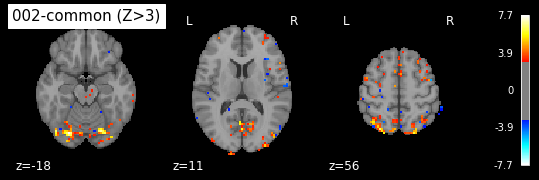

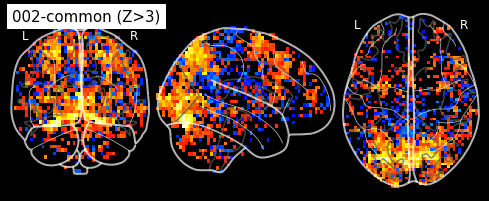

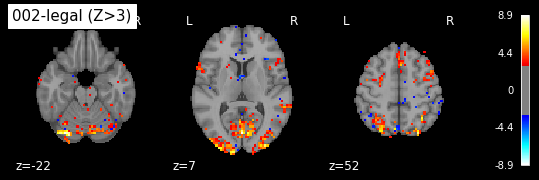

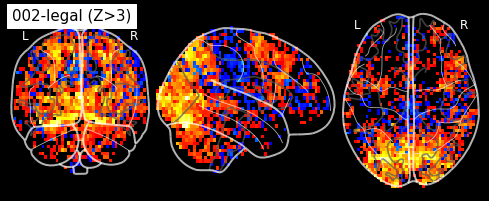

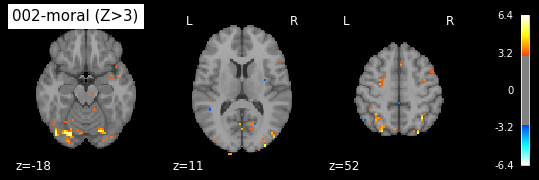

...

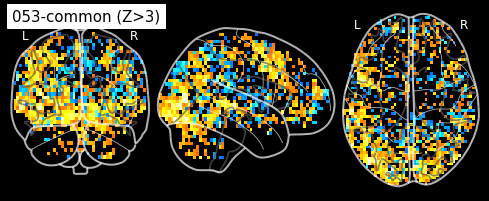

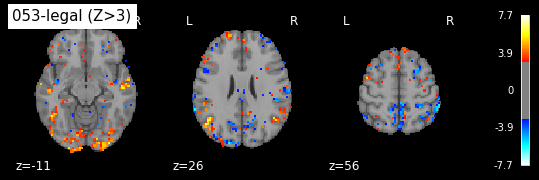

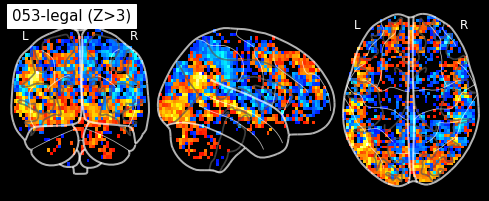

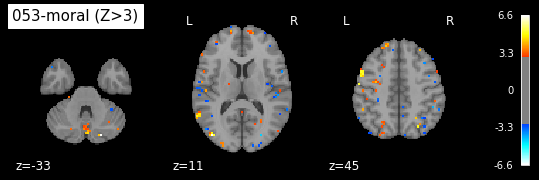

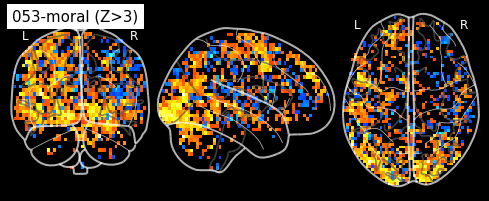

In [39]:
import sys
sys.path.append('/home/hcp/anaconda3/envs/xj/lib/python3.8/site-packages')
import os
import numpy as np
import pandas as pd
import nibabel as nib
from glob import glob
from bids import BIDSLayout
import matplotlib.pyplot as plt
from nilearn.image import mean_img, load_img
from nilearn.glm import threshold_stats_img
from nilearn.glm.first_level import FirstLevelModel
from nilearn.glm.second_level import SecondLevelModel
from nilearn.reporting import make_glm_report, get_clusters_table
from nilearn.plotting import plot_stat_map, plot_anat, plot_img, show, plot_glass_brain, plot_design_matrix, plot_contrast_matrix

def build_Subs():
    path = '/mnt/sdb1/Judge-fMRI/Data/AnalysisData/Information_of_trials.txt'
    with open(path, 'r', encoding='utf-8') as f:
        f_data = f.read().split('\n')
        data = f_data[3:]
        judge_subs = f_data[1].split(',')
        layperson_subs = f_data[2].split(',')

    build_subs_dict = {}
    for i in data:
        li = i.split(',')
        build_subs_dict[li[0]] = []
        for j in range(int((len(li)-1)/2)):
            build_subs_dict[li[0]].append([li[2*j+1], li[(j+1)*2]])

    return judge_subs, layperson_subs, build_subs_dict


judge_subs, layperson_subs, build_subs_dict = build_Subs()

data_dir = '/mnt/sdb1/Judge-fMRI-Data/Bids_with_AFNI_Despike'
layout = BIDSLayout(data_dir, derivatives=True)
tr = layout.get_tr(derivatives=True)

outdir = 'results_drop_trials_only_on_DesignMatrix_0620'
if not os.path.exists(outdir):
    os.mkdir(outdir)


fmri_glm = FirstLevelModel(t_r=tr,
                           noise_model='ar1',
                           hrf_model='spm',
                           drift_model='cosine',
                           high_pass=1./160,
                           signal_scaling=False,
                           minimize_memory=False,
                           n_jobs=4)

conditions = ['common', 'legal', 'moral']
# temp = glob(os.path.join(data_dir,'sub-*'))
# subs = sorted([i.split('\\')[-1][-3:] for i in temp])
# subs = ['001', '002', '003', '004', '005', '049', '050', '051', '052', '053']
subs = judge_subs + layperson_subs
print(subs)

for sub in subs:
    fmri_file = layout.get(subject=sub, task='judgment', scope='derivatives', suffix='bold', extension='nii.gz', return_type='file')[0]
    # alter the BOLD 
#     if sub in list(build_subs_dict.keys()):
#         img = load_img(fmri_file)
#         data = img.get_fdata()
#         for j in build_subs_dict[sub]:
#             img._fdata_cache[:, :, :, int(j[0]) - 1: int(j[1])] = 0
#         data = img.get_fdata()
#         new_image = nib.Nifti1Image(data, img.affine)
#         fmri_file = sub + '_new.nii.gz'
#         nib.save(new_image, fmri_file)
#     print(fmri_file)
    
    event_file = layout.get(subject=sub, suffix='events')[0].path
    events = pd.read_table(event_file)
    # alter the design matrix
    da_index = []
    if sub in list(build_subs_dict.keys()):
        for j in build_subs_dict[sub]:
            da = events[int(j[0])*3<=events['onset']][events['onset']<=int(j[1])*3]
            da_index += da.index.to_list()
        events = events.drop(da_index)

    confounds_file = layout.get(subject=sub, scope='derivatives', extension='.tsv')[0].path
    confounds = pd.read_table(confounds_file)
    confounds_glm = confounds[['trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']].replace(np.nan, 0)

    fix = None
#     if sub in list(build_subs_dict.keys()):
#         fix = build_subs_dict[sub]
    fmri_glm = fmri_glm.fit(fmri_file, events, confounds_glm, fix)
    
    for con in conditions:
        z_map = fmri_glm.compute_contrast(con, output_type='z_score')
        plot_stat_map(z_map, threshold=3.0, display_mode='z', cut_coords=3, black_bg=True, title=sub + '-' + con + ' (Z>3)')
        plot_glass_brain(z_map, threshold=3.0, black_bg=True, plot_abs=False, title=sub + '-' + con + ' (Z>3)')
        plt.show()
        z_map.to_filename(os.path.join(outdir, 'sub-%s-%s_zmap.nii.gz' % (sub, con)))
#     print(sub)

# <center>一次性处理所有被试的FirstLevel</center>

In [41]:
import os
import numpy as np
import pandas as pd
from glob import glob
from bids import BIDSLayout
import matplotlib.pyplot as plt
from nilearn.image import mean_img
from nilearn.glm import threshold_stats_img
from nilearn.glm.first_level import FirstLevelModel
from nilearn.glm.second_level import SecondLevelModel
from nilearn.reporting import make_glm_report, get_clusters_table
from nilearn.plotting import plot_stat_map, plot_anat, plot_img, show, plot_glass_brain, plot_design_matrix, plot_contrast_matrix

# data_dir = '/media/hcp/sdb12/bids'
data_dir = '/mnt/sdb1/Judge-fMRI-Data/Bids_with_AFNI_Despike'
layout = BIDSLayout(data_dir, derivatives=True)
tr = layout.get_tr(derivatives=True)

outdir = 'results_cleaned'
if not os.path.exists(outdir):
    os.mkdir(outdir)


fmri_glm = FirstLevelModel(t_r=tr,
                           noise_model='ar1',
                           hrf_model='spm',
                           drift_model='cosine',
                           high_pass=1./160,
                           signal_scaling=False,
                           minimize_memory=False,
                           n_jobs=4)

conditions = ['common', 'legal', 'moral']
temp = glob(os.path.join(data_dir,'sub-*'))
subs = sorted([i.split('\\')[-1][-3:] for i in temp])
#subs = ['001', '002', '003', '004', '005', '049', '050', '051', '052', '053']
print(subs)

for sub in subs:
    fmri_file = layout.get(subject=sub, task='judgment', scope='derivatives', suffix='bold', extension='nii.gz', return_type='file')[0]

    event_file = layout.get(subject=sub, suffix='events')[0].path
    events = pd.read_table(event_file)

    confounds_file = layout.get(subject=sub, scope='derivatives', extension='.tsv')[0].path
    confounds = pd.read_table(confounds_file)
    confounds_glm = confounds[['trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']].replace(np.nan, 0)

    fmri_glm = fmri_glm.fit(fmri_file, events, confounds_glm)

    for con in conditions:
        z_map = fmri_glm.compute_contrast(con, output_type='z_score')
        z_map.to_filename(os.path.join(outdir, 'sub-%s-%s_zmap.nii.gz' % (sub, con)))
    print(sub)

['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053']
001
002
003
004
005
006
007
008
009
010
011
012
013
014
015
016
017
018
019
020
021
022
023
024
025
031
032
033
034
035
036
037
038
039
040
041
042
043
044
045
046
047
048
049
050
051
052
053
